# Importing PyTorch and check cuda

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import torch

print(f'{torch.cuda.is_available() = }')
print(f'{torch.cuda.device_count() = }')

torch.cuda.is_available() = True
torch.cuda.device_count() = 1


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 11.8 MB/s eta 0:00:00


In [ ]:
!pip install -U ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 62.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 73.8 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.9
    Uninstalling widgetsnbextension-3.6.9:
      Successfully uninstalled widgetsnbextension-3.6.9
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Tampilkan isi direktori di MyDrive
!ls '/content/drive/MyDrive/dataset_licenseplate'

annotations  images


In [ ]:
dataset_path = "/content/drive/MyDrive/dataset_licenseplate"

# Extracting digits from file name

In [ ]:
import re

def the_number_in_the_string(filename):
    match = re.search(r'(\d+)', filename)

    if match:
        return int(match.group(0))
    else:
        return 0

In [ ]:
print(the_number_in_the_string("file123.txt"))
print(the_number_in_the_string("no_numbers"))

123
0


# Formatting the XML File and creating DF

In [ ]:
#to store labels and image info
labels_dict = dict(
    img_path=[],
    xmin=[],
    xmax=[],
    ymin=[],
    ymax=[],
    img_w=[],
    img_h=[]
)

In [ ]:
labels_dict

{'img_path': [],
 'xmin': [],
 'xmax': [],
 'ymin': [],
 'ymax': [],
 'img_w': [],
 'img_h': []}

In [ ]:
import os
from glob import glob

#get XML files from the annotations dir
xml_files = glob(f'{dataset_path}/annotations/*.xml')
xml_files

['/content/drive/MyDrive/dataset_licenseplate/annotations/Cars11.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars129.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars0.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars115.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars112.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars106.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars103.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars109.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars144.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars135.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars121.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars126.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars101.xml',
 '/content/drive/MyDrive/dataset_licenseplate/annotations/Cars114.x

In [ ]:
import xml.etree.ElementTree as xet

In [ ]:
import cv2

# Process each XML file, sorted by the numerical value in the filename
for filename in sorted(xml_files, key=the_number_in_the_string):

    info = xet.parse(filename)
    root = info.getroot()

 # Finding BB info
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

# join full path
    img_name = root.find('filename').text
    img_path = os.path.join(dataset_path, 'images', img_name)

# add to dictionary
    labels_dict['img_path'].append(img_path)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

# Read img and get dimensions
    height, width, _ = cv2.imread(img_path).shape
    labels_dict['img_w'].append(width)
    labels_dict['img_h'].append(height)

    alldata = pd.DataFrame(labels_dict)

In [ ]:
alldata

,img_path,xmin,xmax,ymin,ymax,img_w,img_h
0,/content/drive/MyDrive/dataset_licenseplate/im...,226,419,125,173,500,268
1,/content/drive/MyDrive/dataset_licenseplate/im...,134,262,128,160,400,248
2,/content/drive/MyDrive/dataset_licenseplate/im...,229,270,176,193,400,400
3,/content/drive/MyDrive/dataset_licenseplate/im...,142,261,128,157,400,225
4,/content/drive/MyDrive/dataset_licenseplate/im...,156,503,82,253,590,350
...,...,...,...,...,...,...,...
428,/content/drive/MyDrive/dataset_licenseplate/im...,142,258,128,157,400,225
429,/content/drive/MyDrive/dataset_licenseplate/im...,86,208,166,195,301,400
430,/content/drive/MyDrive/dataset_licenseplate/im...,38,116,159,197,400,225
431,/content/drive/MyDrive/dataset_licenseplate/im...,55,343,82,147,400,192


In [ ]:
from sklearn.model_selection import train_test_split

# train test val split
train, test = train_test_split(alldata, test_size=1/10, random_state=42)
train, val = train_test_split(train, train_size=8/9, random_state=42)

print(f'''
      len(train) = {len(train)}
      len(val) = {len(val)}
      len(test) = {len(test)}
''')



      len(train) = 345
      len(val) = 44
      len(test) = 44



In [ ]:
import shutil

# remove if exists
if os.path.exists('datasets'):
    shutil.rmtree('datasets')

In [ ]:
train

,img_path,xmin,xmax,ymin,ymax,img_w,img_h
124,/content/drive/MyDrive/dataset_licenseplate/im...,305,320,256,267,400,267
315,/content/drive/MyDrive/dataset_licenseplate/im...,12,385,98,181,400,300
282,/content/drive/MyDrive/dataset_licenseplate/im...,37,319,145,203,350,263
236,/content/drive/MyDrive/dataset_licenseplate/im...,223,250,106,119,400,176
112,/content/drive/MyDrive/dataset_licenseplate/im...,49,164,135,191,240,400
...,...,...,...,...,...,...,...
110,/content/drive/MyDrive/dataset_licenseplate/im...,286,328,133,159,400,267
255,/content/drive/MyDrive/dataset_licenseplate/im...,116,273,156,188,400,267
292,/content/drive/MyDrive/dataset_licenseplate/im...,91,137,187,208,400,267
54,/content/drive/MyDrive/dataset_licenseplate/im...,148,257,61,118,400,300


# Creating data in YOLO format

In [ ]:
def make_split_folder_in_yolo_format(split_name, split_df):
# folders in YOLO format
    labels_path = os.path.join('datasets', 'cars_license_plate_new', split_name, 'labels')
    images_path = os.path.join('datasets', 'cars_license_plate_new', split_name, 'images')


    os.makedirs(labels_path)
    os.makedirs(images_path)


    for _, row in split_df.iterrows():
        img_name, img_extension = os.path.splitext(os.path.basename(row['img_path']))


        x_center = (row['xmin'] + row['xmax']) / 2 / row['img_w']
        y_center = (row['ymin'] + row['ymax']) / 2 / row['img_h']
        width = (row['xmax'] - row['xmin']) / row['img_w']
        height = (row['ymax'] - row['ymin']) / row['img_h']

    # save lables in YOLO format
        label_path = os.path.join(labels_path, f'{img_name}.txt')
        with open(label_path, 'w') as file:
            file.write(f"0 {x_center:.4f} {y_center:.4f} {width:.4f} {height:.4f}\n")


        shutil.copy(row['img_path'], os.path.join(images_path, img_name + img_extension))

    print(f"Created '{images_path}' and '{labels_path}'")

In [ ]:
make_split_folder_in_yolo_format("train", train)
make_split_folder_in_yolo_format("val", val)
make_split_folder_in_yolo_format("test", test)

Created 'datasets/cars_license_plate_new/train/images' and 'datasets/cars_license_plate_new/train/labels'
Created 'datasets/cars_license_plate_new/val/images' and 'datasets/cars_license_plate_new/val/labels'
Created 'datasets/cars_license_plate_new/test/images' and 'datasets/cars_license_plate_new/test/labels'


In [ ]:
os.getcwd()

'/content'

# Object detection and bounding box

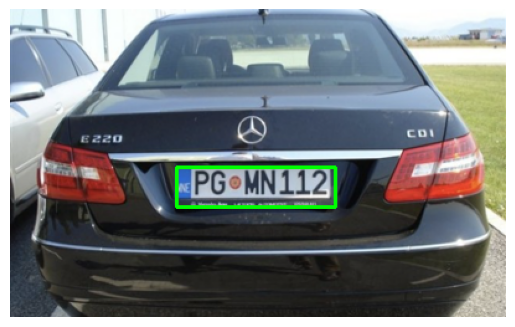

In [ ]:
image_dir = 'datasets/cars_license_plate_new/train/images'
label_dir = 'datasets/cars_license_plate_new/train/labels'

image_files = sorted(os.listdir(image_dir))
first_image_file = image_files[0]

# Construct paths for image and its label
image_path = os.path.join(image_dir, first_image_file)
label_path = os.path.join(label_dir, os.path.splitext(first_image_file)[0] + '.txt')

image = cv2.imread(image_path)

# Convert img BGR to OpenCV
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


with open(label_path, 'r') as f:
    lines = f.readlines()


for line in lines:

    class_id, x_center, y_center, width, height = map(float, line.strip().split())
    img_height, img_width, _ = image.shape

# Convert YOLO format to bounding box format
    x_center *= img_width
    y_center *= img_height
    width *= img_width
    height *= img_height


    x1 = int(x_center - width / 2)
    y1 = int(y_center - height / 2)
    x2 = int(x_center + width / 2)
    y2 = int(y_center + height / 2)

    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)


plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
datasets_yaml = '''
path: cars_license_plate_new

train: train/images
val: val/images
test: test/images

# number of classes
nc: 1

# class names
names: ['license_plate']
'''

# Write the content to the datasets.yaml file
with open('datasets.yaml', 'w') as file:
    file.write(datasets_yaml)

# Using YOLOv8 nano model

In [ ]:
# using YOLOv8 nano
from ultralytics import YOLO
model = YOLO('yolov8n.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 110MB/s]


In [ ]:
os.environ['WANDB_MODE'] = 'offline'

In [ ]:
model.train(
    data='datasets.yaml',
    epochs=100,
    batch=16,
    device='cpu',
    imgsz=320,  # Image size (width and height) for training
    cache=True
)

Ultralytics 8.3.20 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.00GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=datasets.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=320, save=True, save_period=-1, cache=True, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width

100%|██████████| 755k/755k [00:00<00:00, 24.1MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.


Freezing layer 'model.22.dfl.conv.weight'


train: Scanning /content/datasets/cars_license_plate_new/train/labels... 345 images, 0 backgrounds, 0 corrupt: 100%|██████████| 345/345 [00:00<00:00, 806.25it/s]

train: New cache created: /content/datasets/cars_license_plate_new/train/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.1GB RAM): 100%|██████████| 345/345 [00:04<00:00, 82.36it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/cars_license_plate_new/val/labels... 44 images, 0 backgrounds, 0 corrupt: 100%|██████████| 44/44 [00:00<00:00, 902.65it/s]

val: New cache created: /content/datasets/cars_license_plate_new/val/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.0GB RAM): 100%|██████████| 44/44 [00:00<00:00, 60.31it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.683      2.823      1.283         22        320: 100%|██████████| 22/22 [00:50<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.72s/it]

                   all         44         44    0.00378      0.932      0.535      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G       1.47      1.489      1.136         17        320: 100%|██████████| 22/22 [00:47<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         44         44    0.00432      0.932     0.0845     0.0476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      1.498      1.404      1.164         18        320: 100%|██████████| 22/22 [00:47<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44      0.913       0.24      0.628      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      1.546      1.347      1.216         19        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all         44         44      0.486       0.43       0.48      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      1.581      1.292      1.187         17        320: 100%|██████████| 22/22 [00:47<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all         44         44      0.342        0.5      0.392      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      1.549       1.19      1.191         24        320: 100%|██████████| 22/22 [00:47<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44      0.652      0.341      0.392      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      1.516       1.18      1.188         24        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all         44         44      0.595      0.601      0.649      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G       1.42       1.14      1.167         19        320: 100%|██████████| 22/22 [00:50<00:00,  2.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all         44         44      0.698      0.795      0.762      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.417      1.047      1.144         20        320: 100%|██████████| 22/22 [00:49<00:00,  2.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         44         44      0.851      0.777      0.825      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.409      1.035      1.134         18        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44      0.684      0.773      0.767      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G      1.297     0.9433      1.102         15        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         44         44      0.775      0.784      0.828      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.359     0.9773      1.137         13        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all         44         44      0.772      0.846      0.886      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G       1.32     0.9206      1.097         21        320: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         44         44      0.957      0.705      0.875       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      1.321     0.9031      1.107         18        320: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         44         44      0.826      0.756       0.86      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      1.341     0.9055      1.094         21        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]

                   all         44         44      0.765        0.5      0.639      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      1.329     0.8904      1.094         15        320: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         44         44      0.916      0.795      0.828      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      1.302     0.8637      1.088         21        320: 100%|██████████| 22/22 [00:48<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         44         44      0.902      0.835      0.883      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G      1.256     0.8302      1.083         12        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all         44         44      0.907      0.886      0.891      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      1.229     0.8258      1.084         18        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all         44         44      0.869      0.908      0.918      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      1.227     0.8183      1.078         22        320: 100%|██████████| 22/22 [00:48<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         44         44       0.85      0.841      0.864      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      1.216     0.7817      1.067         15        320: 100%|██████████| 22/22 [00:50<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         44         44      0.854      0.798       0.86      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      1.211     0.7877      1.067         20        320: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         44         44      0.856      0.864      0.895       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G      1.224     0.7781      1.077         20        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         44         44      0.862      0.909      0.874      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      1.234     0.7822      1.093         10        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         44         44      0.867      0.886      0.886      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G       1.19     0.7558      1.064         23        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         44         44      0.924      0.831        0.9      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      1.208     0.7674      1.051         13        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all         44         44      0.871      0.955      0.943      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G      1.196     0.7491      1.074         14        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.00s/it]

                   all         44         44      0.942      0.841      0.926      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      1.161     0.7555      1.051         24        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         44         44      0.785      0.746      0.802      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G      1.162     0.7666      1.043         18        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all         44         44      0.888      0.897       0.92      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G      1.213     0.7676      1.037         22        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all         44         44      0.883      0.854      0.891      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G      1.143      0.763      1.039         14        320: 100%|██████████| 22/22 [00:48<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         44         44      0.843      0.857      0.838      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G      1.094     0.6875      1.021         15        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44      0.877      0.886      0.902      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      1.099     0.7069      1.008         18        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all         44         44        0.9      0.886      0.905      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G      1.127      0.716      1.036         15        320: 100%|██████████| 22/22 [00:49<00:00,  2.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]

                   all         44         44      0.862      0.818      0.871      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G      1.079     0.6736      1.038         16        320: 100%|██████████| 22/22 [00:48<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]

                   all         44         44      0.807      0.857      0.835      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G      1.044     0.6559      1.014         15        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]

                   all         44         44      0.887      0.841      0.887      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G       1.04     0.6675       1.02         15        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all         44         44      0.911      0.818      0.902       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G      1.054     0.6679     0.9898         22        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]

                   all         44         44      0.842      0.864      0.914      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G      1.059      0.637      1.017         11        320: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         44         44      0.897      0.864      0.929      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G       1.02     0.6675     0.9997         20        320: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]

                   all         44         44      0.875      0.798      0.881      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G      1.009     0.6352     0.9974         24        320: 100%|██████████| 22/22 [00:50<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         44         44      0.947      0.817      0.912      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.9891     0.6247     0.9934         13        320: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         44         44      0.943      0.745      0.868      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.9853     0.6211     0.9669         19        320: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all         44         44      0.901      0.823        0.9      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G      1.003     0.6261     0.9955         16        320: 100%|██████████| 22/22 [00:49<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.05it/s]

                   all         44         44      0.881      0.839      0.861      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G      1.016     0.6234      1.004         20        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         44         44      0.915      0.795      0.844      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G      1.034     0.6501     0.9955         22        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.08it/s]

                   all         44         44      0.851      0.818       0.84      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G      1.016      0.628     0.9746         15        320: 100%|██████████| 22/22 [00:50<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all         44         44      0.904      0.856      0.913      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G      1.012     0.6281     0.9902          9        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         44         44      0.921      0.798      0.869      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.9956     0.6073     0.9857         18        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         44         44        0.9      0.814      0.886      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.9389     0.5733      0.971         22        320: 100%|██████████| 22/22 [00:49<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         44         44      0.899      0.795      0.863      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.9673     0.6004     0.9679         18        320: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         44         44      0.848      0.909      0.913      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.9952     0.6039     0.9881         19        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         44         44      0.905      0.818      0.912      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.9403     0.5648     0.9446         16        320: 100%|██████████| 22/22 [00:49<00:00,  2.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all         44         44      0.891      0.818      0.895      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.9527     0.5764     0.9781         17        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44      0.902      0.835      0.924      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G       0.94     0.5722      0.969         20        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         44         44      0.903      0.795      0.915      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G     0.9335     0.5695     0.9602         20        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all         44         44      0.945      0.777      0.937      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G     0.9172     0.5577     0.9519         20        320: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         44         44      0.862      0.853      0.913      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G     0.8846     0.5317     0.9393         21        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         44         44      0.926      0.795      0.914      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G     0.9457     0.5774     0.9635         14        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]

                   all         44         44      0.811      0.909      0.899      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G     0.9306     0.5694     0.9789         18        320: 100%|██████████| 22/22 [00:50<00:00,  2.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]

                   all         44         44      0.973      0.815      0.893       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G     0.9482     0.5872     0.9595         16        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         44         44      0.952      0.773      0.926      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G     0.9261     0.5639     0.9494         15        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         44         44      0.905      0.886      0.938       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G     0.8794     0.5318     0.9538         17        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]

                   all         44         44      0.973      0.813      0.903      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G      0.866     0.5077       0.94         11        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]

                   all         44         44      0.971      0.749       0.88      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.8667     0.5277      0.943         17        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         44         44      0.875      0.886      0.916      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G      0.919     0.5467     0.9533         19        320: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all         44         44      0.868      0.895      0.916      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.8799     0.5269     0.9397         19        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         44         44      0.803      0.932      0.916      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G       0.91     0.5291     0.9589         17        320: 100%|██████████| 22/22 [00:47<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         44         44      0.897      0.773      0.921      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G     0.8809       0.53      0.953         17        320: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]

                   all         44         44      0.903      0.841      0.928      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G     0.8644     0.5272     0.9513         21        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]

                   all         44         44      0.919      0.841      0.919      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.8501     0.5064     0.9365         20        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44      0.898      0.797      0.907      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.8894     0.5308     0.9606         12        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         44         44      0.923      0.816      0.906      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G     0.8486     0.5029     0.9301         17        320: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all         44         44      0.848      0.886      0.906      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G     0.8126     0.5176     0.9144         22        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         44         44      0.826      0.862      0.882      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.8215     0.4995     0.9313         15        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         44         44      0.825      0.886      0.899       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G     0.8277     0.4881     0.9486         11        320: 100%|██████████| 22/22 [00:49<00:00,  2.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.01s/it]

                   all         44         44      0.868      0.841      0.905      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G     0.8196     0.4958     0.9409         14        320: 100%|██████████| 22/22 [00:48<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all         44         44      0.855      0.886      0.922      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.8052     0.5006     0.9291         22        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         44         44      0.892      0.795      0.892      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.8068     0.4816     0.9355         11        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]

                   all         44         44       0.95      0.773      0.896      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G     0.7796     0.4686     0.9107         16        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all         44         44      0.956      0.795      0.898      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.8356     0.4851     0.9439         14        320: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         44         44      0.952      0.795      0.892      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.8252     0.5026     0.9376         12        320: 100%|██████████| 22/22 [00:47<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         44         44       0.95      0.795      0.885      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G     0.7838     0.4718     0.9182         18        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         44         44      0.854        0.8      0.905      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G     0.7711      0.467     0.9123         19        320: 100%|██████████| 22/22 [00:48<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all         44         44      0.791      0.909      0.914      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G     0.8051     0.4807     0.9243         20        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         44         44      0.784      0.932      0.919      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G     0.7839     0.4683      0.912         23        320: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         44         44      0.787      0.924      0.923      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.7819     0.4726     0.9099         13        320: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         44         44      0.921      0.792      0.923      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G      0.759     0.4644     0.9093         15        320: 100%|██████████| 22/22 [00:47<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all         44         44       0.95      0.773       0.91      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.7562     0.4643      0.906         18        320: 100%|██████████| 22/22 [00:47<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         44         44      0.934      0.773      0.894      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G     0.7426     0.4643     0.9139         17        320: 100%|██████████| 22/22 [00:47<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         44         44      0.916      0.818      0.897      0.487


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G       1.02      0.559      1.026          9        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all         44         44      0.914      0.818       0.89      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G      1.018     0.5337      1.017          9        320: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all         44         44      0.925      0.818      0.907      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G     0.9874     0.5208      1.009          9        320: 100%|██████████| 22/22 [00:46<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44      0.923      0.795      0.906      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G     0.9525     0.5182     0.9813          9        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         44         44      0.841      0.842      0.899      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G     0.9538     0.5155     0.9869          8        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         44         44       0.86      0.841      0.903      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G     0.9496     0.4947     0.9985          9        320: 100%|██████████| 22/22 [00:47<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         44         44      0.857      0.841      0.907      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G     0.9285     0.4859      0.983          9        320: 100%|██████████| 22/22 [00:46<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         44         44      0.898      0.798      0.908      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G     0.9357     0.4937     0.9844          9        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         44         44      0.955      0.795      0.908      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.9174     0.4794     0.9814          9        320: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         44         44      0.946      0.795      0.908      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G     0.8991     0.4783      0.977          9        320: 100%|██████████| 22/22 [00:46<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all         44         44      0.973      0.816      0.911      0.523



100 epochs completed in 1.411 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.20 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]


                   all         44         44      0.949      0.773       0.91      0.533
Speed: 0.5ms preprocess, 35.7ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▂▄▆████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁
lr/pg1,▆████▇▇▇▇▇▆▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▁▁
lr/pg2,▄██▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁
metrics/mAP50(B),▄▁▄▆▇▇▇▇█▆▇▇█▇▇▇▇▇▇██▇█▇▇█████▇████▇▇███
metrics/mAP50-95(B),▅▁▅▆▆▇▇▇▇▇▇▇█▆▇▇▇▇▇▇███▇███████████▇████
metrics/precision(B),▁▃▅▆▇▇▇▇▇▇▇▇█▇▇█▇██▇███▇▇▇█▇▇▇▇████████▇
metrics/recall(B),██▁▅▆▇▇▇▇▇██▇▆█▇█▇▇▇▇▇▇▇▇█▆█▇█▆▇▇▇▇▆▇▇▇▆
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▆▆▅▅▅▅▃▃▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▃▃▃▃▂


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c2966f049d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

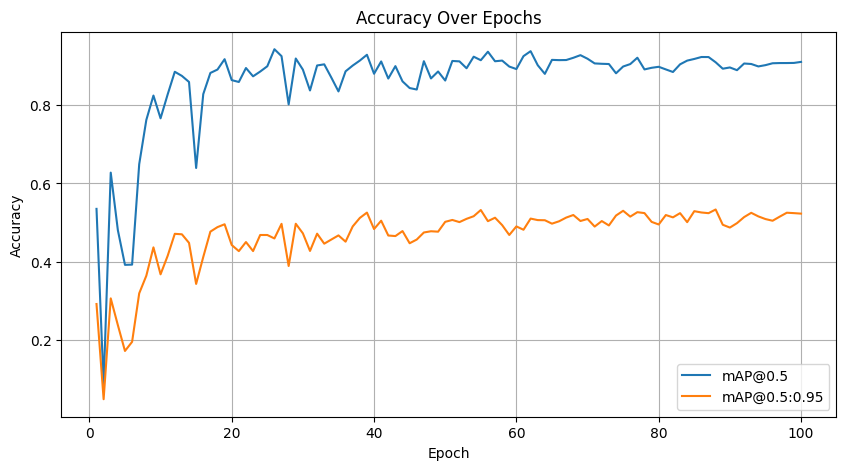

In [ ]:
# Find recent training log dir
log_dir = max(glob('runs/detect/train*'), key=the_number_in_the_string)

results = pd.read_csv(os.path.join(log_dir, 'results.csv'))
results.columns = results.columns.str.strip()

epochs = results.index + 1
mAP_0_5 = results['metrics/mAP50(B)']
mAP_0_5_0_95 = results['metrics/mAP50-95(B)']

plt.figure(figsize=(10, 5))
plt.plot(epochs, mAP_0_5, label='mAP@0.5')
plt.plot(epochs, mAP_0_5_0_95, label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# save model
model.save('license_plate_model.pt')

# Test and predictions

In [ ]:
# to predict test image
def predict_and_plot(path_test_car):

    results = model.predict(path_test_car, device='cpu')


    image = cv2.imread(path_test_car)

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


    for result in results:
        for box in result.boxes:

            x1, y1, x2, y2 = map(int, box.xyxy[0])
            confidence = box.conf[0]

            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

            cv2.putText(image, f'{confidence*100:.2f}%', (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)


    plt.imshow(image)
    plt.axis('off')
    plt.show()


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars425.png: 160x320 1 license_plate, 33.2ms
Speed: 0.9ms preprocess, 33.2ms inference, 0.7ms postprocess per image at shape (1, 3, 160, 320)


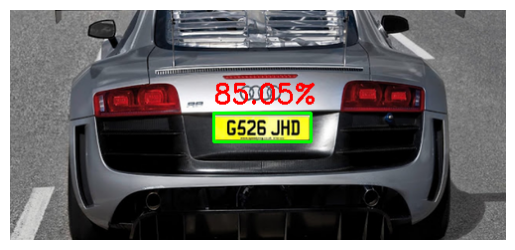

In [ ]:
predict_and_plot(test.iloc[0].img_path)


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars181.png: 320x192 1 license_plate, 36.8ms
Speed: 0.7ms preprocess, 36.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 192)


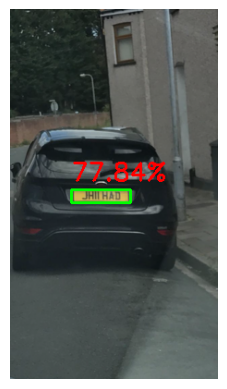

In [ ]:
predict_and_plot(test.iloc[2].img_path)


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars364.png: 224x320 1 license_plate, 53.6ms
Speed: 1.2ms preprocess, 53.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


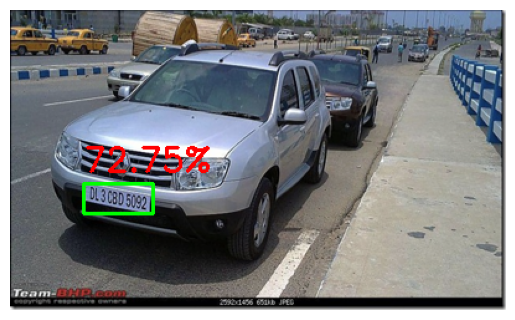

In [ ]:
predict_and_plot(test.iloc[4].img_path)

# Text Extraction OCR

In [ ]:
!apt-get install tesseract-ocr

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 4s (1,072 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 123622 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [ ]:
!pip3 install pytesseract

In [ ]:
import pytesseract
from pytesseract import Output

In [ ]:
# Mengatur path ke tesseract
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars425.png: 160x320 1 license_plate, 31.1ms
Speed: 1.2ms preprocess, 31.1ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)
Detected text: G526 JHD


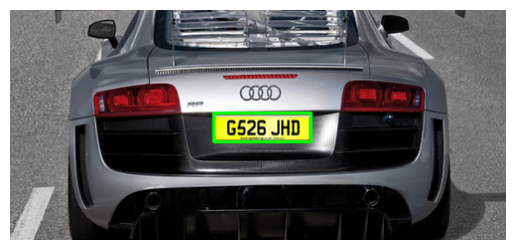


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars75.png: 224x320 (no detections), 38.9ms
Speed: 1.1ms preprocess, 38.9ms inference, 0.5ms postprocess per image at shape (1, 3, 224, 320)


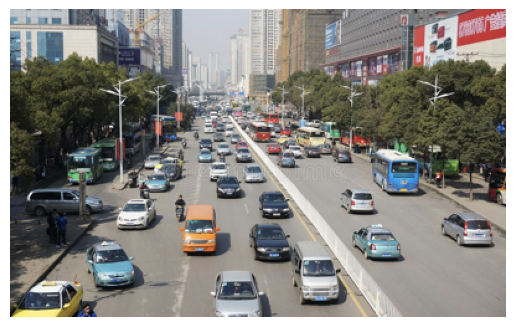


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars181.png: 320x192 1 license_plate, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 192)
Detected text: | JHNTHAD |}


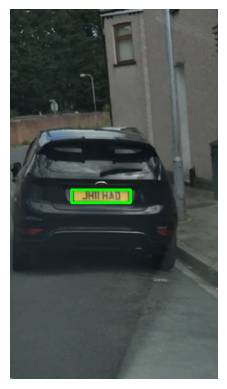


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars30.png: 192x320 2 license_plates, 32.9ms
Speed: 1.1ms preprocess, 32.9ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)
Detected text: 7) res ee
Detected text: EEIIEXELY


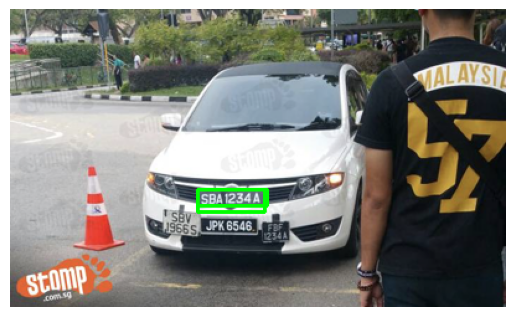


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars364.png: 224x320 1 license_plate, 55.5ms
Speed: 1.1ms preprocess, 55.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
Detected text: 380 5099


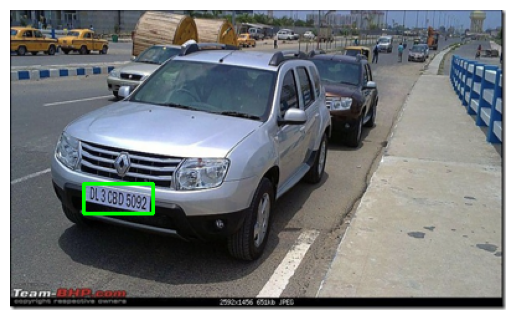


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars408.png: 224x320 1 license_plate, 47.9ms
Speed: 1.2ms preprocess, 47.9ms inference, 3.7ms postprocess per image at shape (1, 3, 224, 320)
Detected text: 


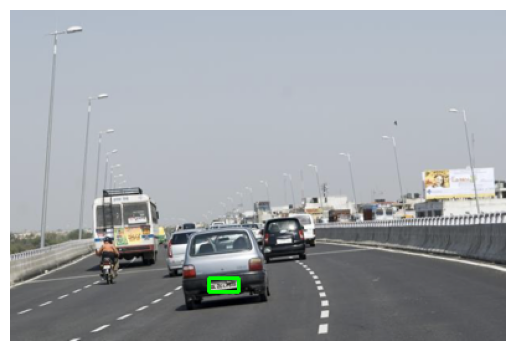


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars253.png: 192x320 1 license_plate, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
Detected text: crnenacne|


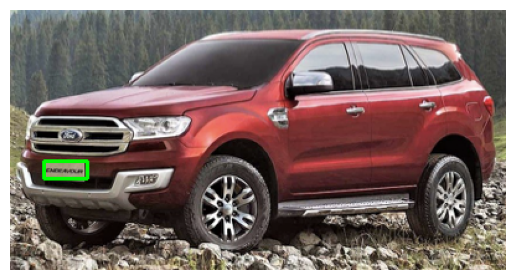


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars155.png: 224x320 1 license_plate, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: 'NCB-O25


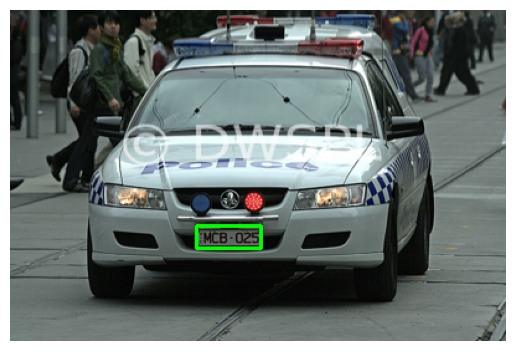


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars168.png: 192x320 1 license_plate, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
Detected text: FA5g


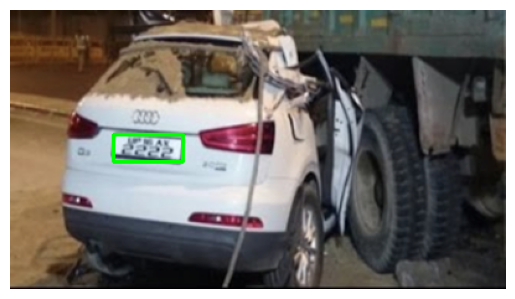


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars415.png: 256x320 1 license_plate, 58.4ms
Speed: 1.3ms preprocess, 58.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Detected text: 


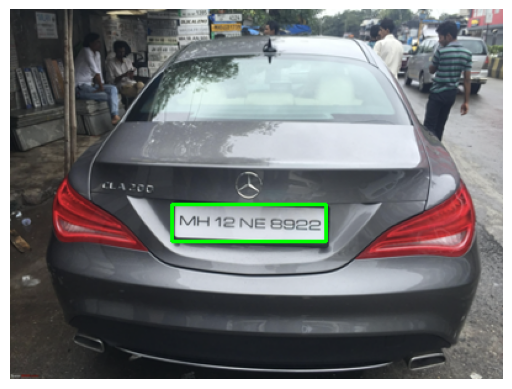


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars152.png: 224x320 1 license_plate, 48.7ms
Speed: 1.3ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: © DL49 AK49


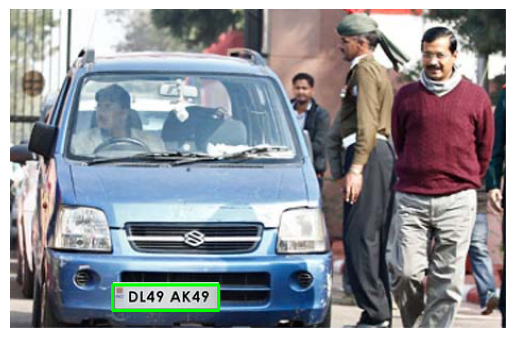


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars70.png: 192x320 1 license_plate, 47.5ms
Speed: 1.0ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
Detected text: i—J


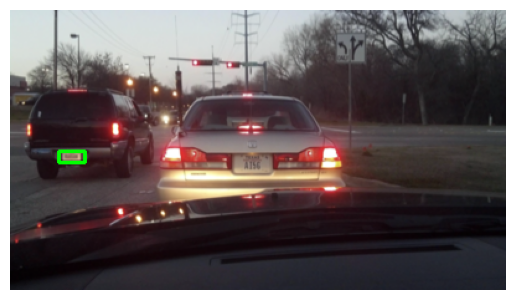


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars203.png: 224x320 1 license_plate, 49.3ms
Speed: 1.2ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Detected text: 4CZI7 KOD


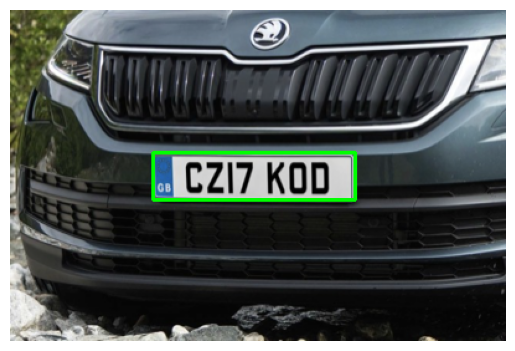


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars335.png: 320x320 2 license_plates, 72.6ms
Speed: 2.1ms preprocess, 72.6ms inference, 5.5ms postprocess per image at shape (1, 3, 320, 320)
Detected text: ie]
Detected text: ICT RANGEDEAVER cc


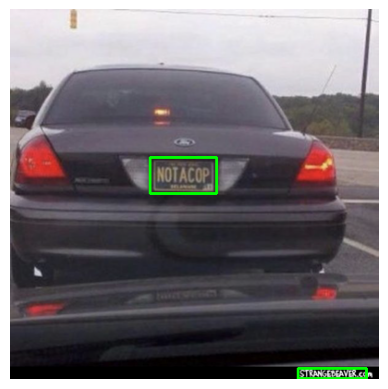


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars39.png: 256x320 1 license_plate, 59.1ms
Speed: 2.0ms preprocess, 59.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Detected text: MH 15BD8677


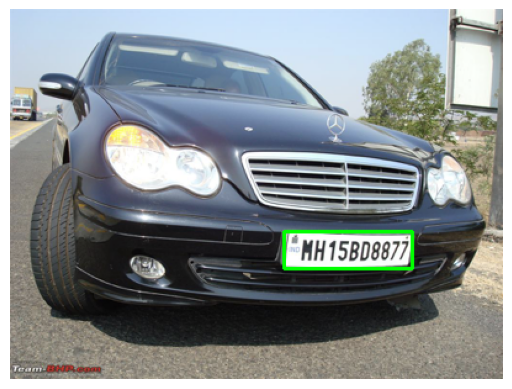


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars395.png: 256x320 1 license_plate, 55.3ms
Speed: 1.4ms preprocess, 55.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Detected text: 


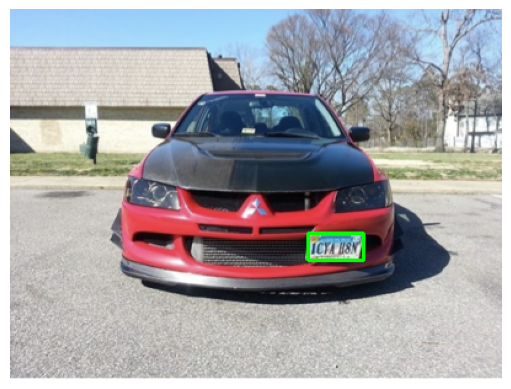


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars274.png: 256x320 1 license_plate, 53.9ms
Speed: 1.3ms preprocess, 53.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Detected text: MANISA’


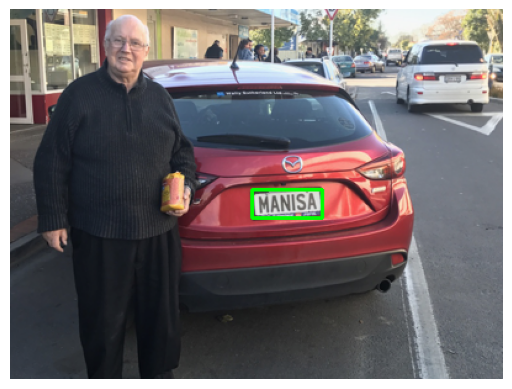


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars72.png: 288x320 1 license_plate, 60.5ms
Speed: 1.8ms preprocess, 60.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
Detected text: MDL7C N 5617


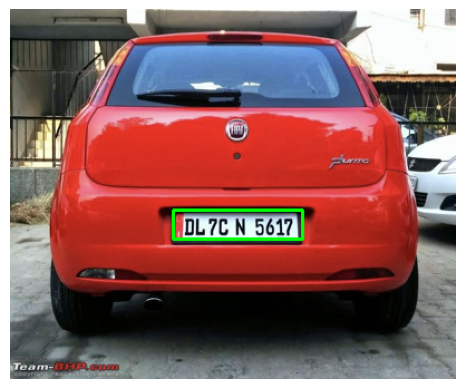


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars9.png: 256x320 1 license_plate, 87.2ms
Speed: 1.4ms preprocess, 87.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Detected text: MHO1AV8866)


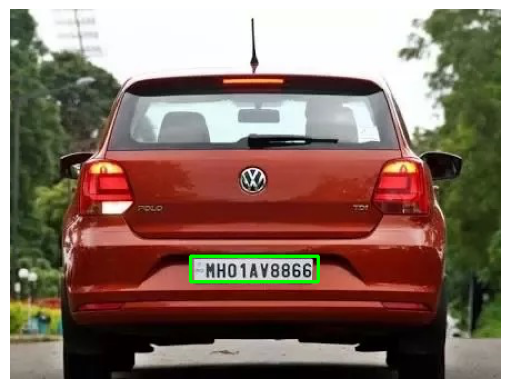


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars281.png: 224x320 1 license_plate, 51.0ms
Speed: 1.2ms preprocess, 51.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: Pa]


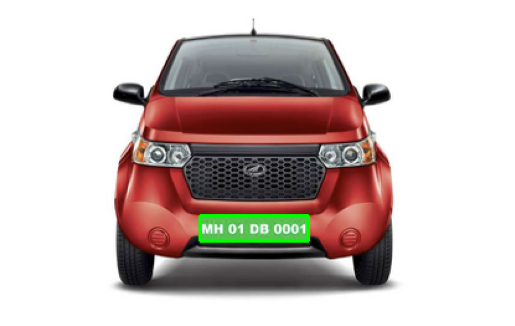


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars287.png: 288x320 1 license_plate, 59.9ms
Speed: 1.5ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Detected text: MDL7C N 5617


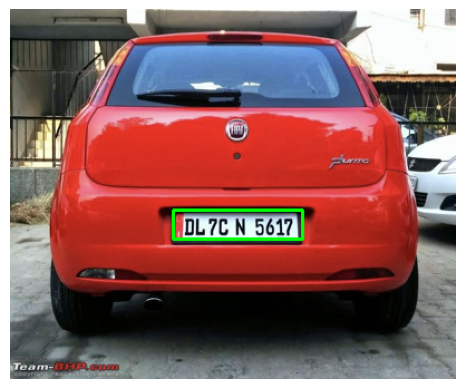


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars362.png: 256x320 (no detections), 56.8ms
Speed: 1.3ms preprocess, 56.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 320)


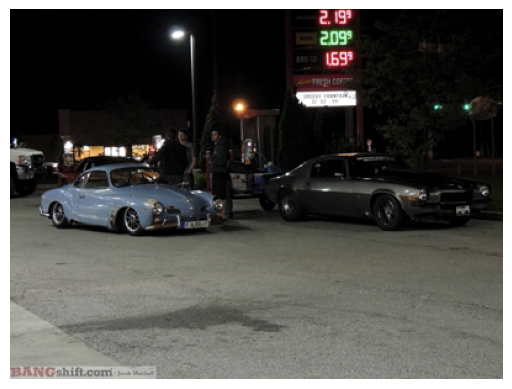


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars353.png: 224x320 1 license_plate, 59.0ms
Speed: 1.2ms preprocess, 59.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Detected text: ry


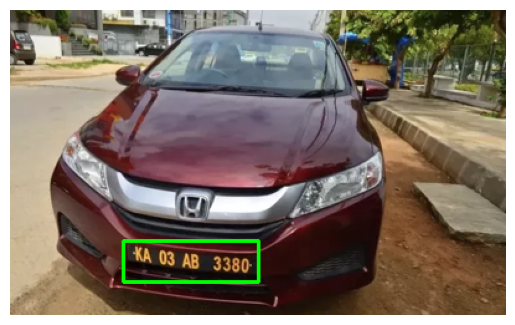


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars55.png: 256x320 1 license_plate, 56.2ms
Speed: 1.3ms preprocess, 56.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Detected text: 9214)


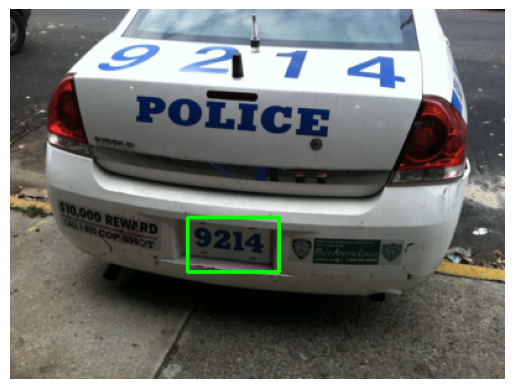


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars289.png: 256x320 (no detections), 53.0ms
Speed: 1.3ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 320)


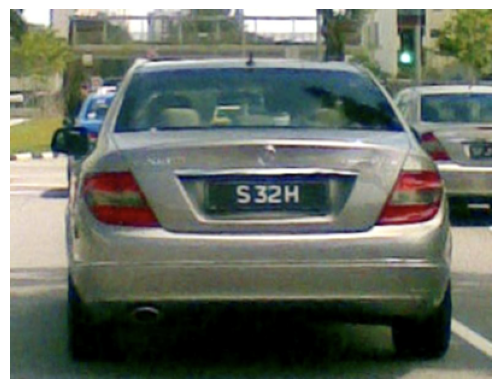


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars198.png: 256x320 1 license_plate, 55.4ms
Speed: 1.2ms preprocess, 55.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
Detected text: MHO1AV8866)


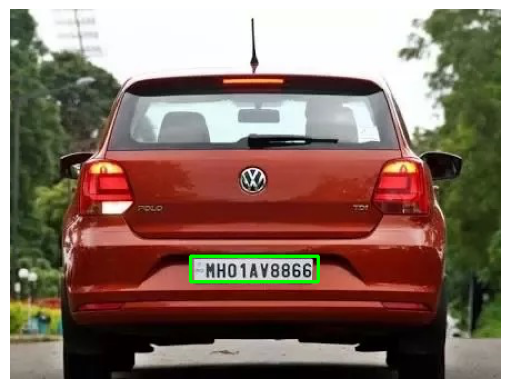


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars148.png: 192x320 1 license_plate, 44.8ms
Speed: 1.1ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
Detected text: Done


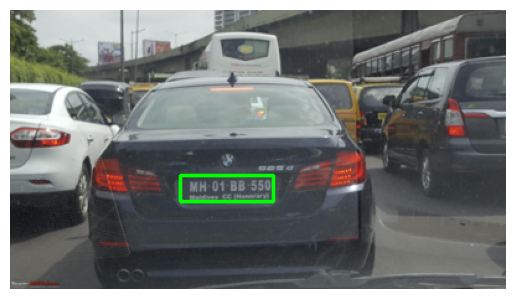


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars392.png: 224x320 3 license_plates, 53.2ms
Speed: 1.2ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: 
Detected text: Sy
Detected text: 072649 Me


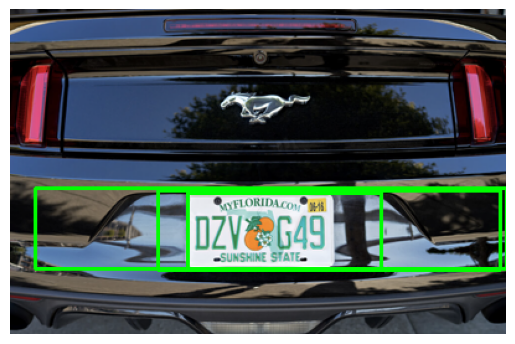


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars341.png: 224x320 1 license_plate, 56.4ms
Speed: 1.2ms preprocess, 56.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Detected text: LT TC a8 |


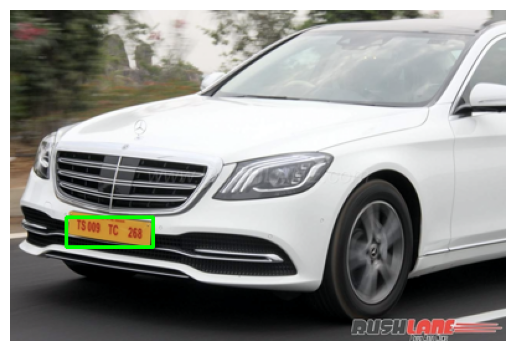


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars268.png: 256x320 (no detections), 56.2ms
Speed: 1.2ms preprocess, 56.2ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 320)


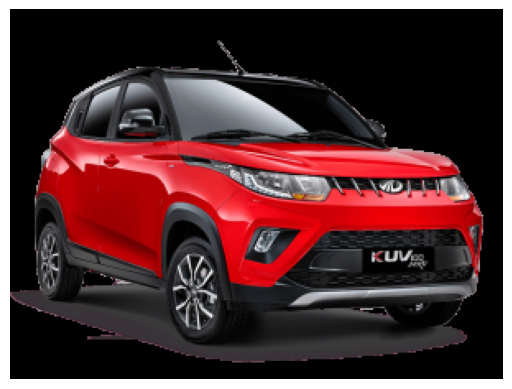


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars126.png: 256x320 1 license_plate, 56.2ms
Speed: 1.3ms preprocess, 56.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Detected text: Kn osng


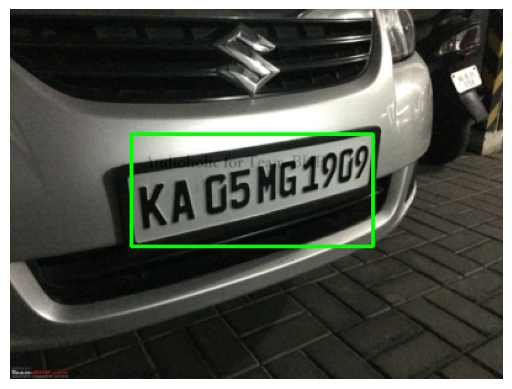


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars400.png: 224x320 1 license_plate, 51.2ms
Speed: 1.2ms preprocess, 51.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Detected text: 


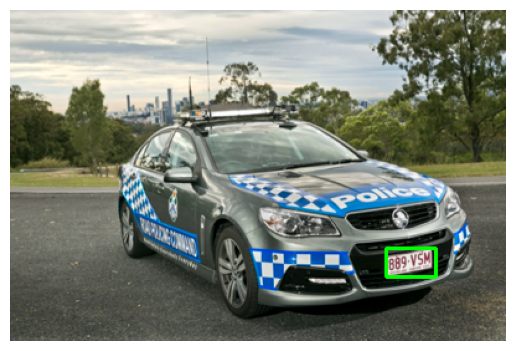


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars305.png: 192x320 1 license_plate, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
Detected text: 


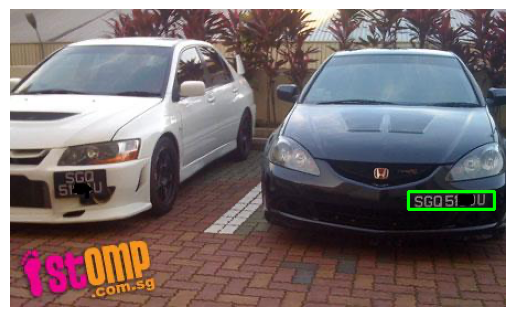


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars93.png: 224x320 1 license_plate, 56.8ms
Speed: 1.2ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: LB


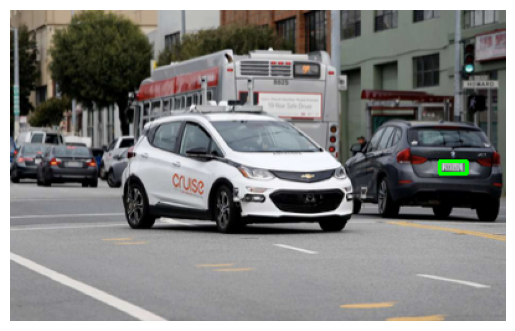


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars428.png: 192x320 1 license_plate, 66.7ms
Speed: 1.0ms preprocess, 66.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
Detected text: -DZI7 YXR


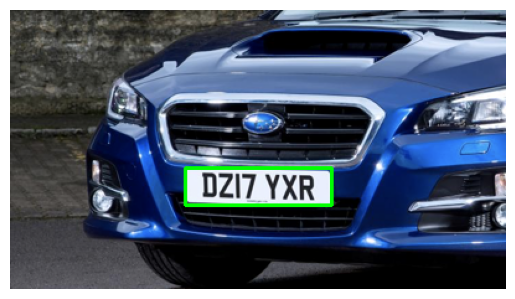


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars77.png: 224x320 1 license_plate, 52.1ms
Speed: 1.4ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: HR 26CU6799|


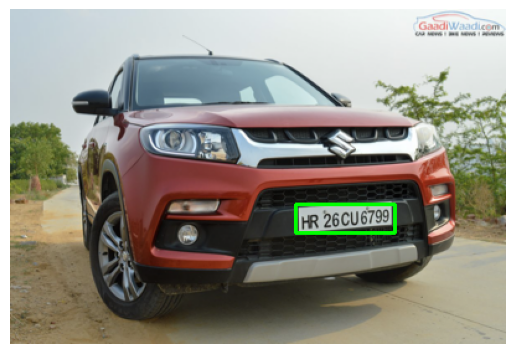


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars298.png: 224x320 1 license_plate, 48.0ms
Speed: 1.2ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: 


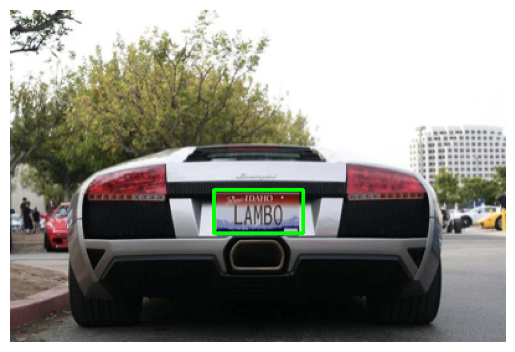


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars140.png: 224x320 1 license_plate, 79.3ms
Speed: 1.1ms preprocess, 79.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Detected text: Ne ae
CHO1ANO001


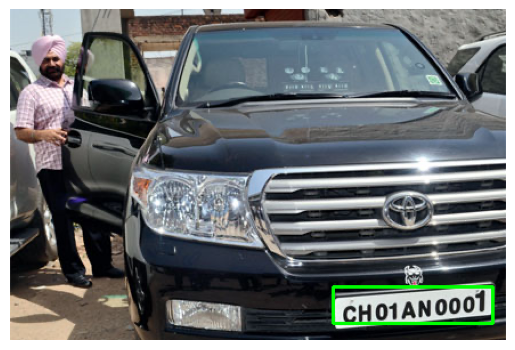


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars323.png: 192x320 1 license_plate, 49.5ms
Speed: 1.0ms preprocess, 49.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
Detected text: TN SSF 2378


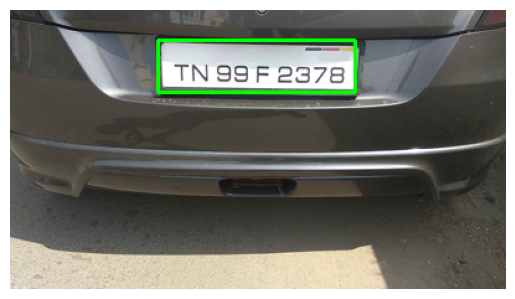


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars429.png: 320x256 1 license_plate, 57.1ms
Speed: 1.3ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Detected text: KAISER |


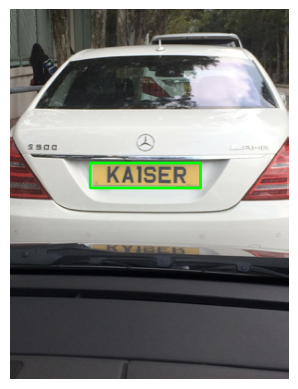


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars225.png: 224x320 1 license_plate, 87.3ms
Speed: 1.3ms preprocess, 87.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Detected text: - JAG2 UAR


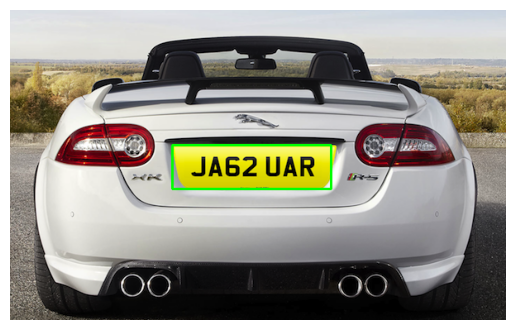


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars154.png: 320x256 1 license_plate, 65.6ms
Speed: 1.4ms preprocess, 65.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
Detected text: q ngs 2662


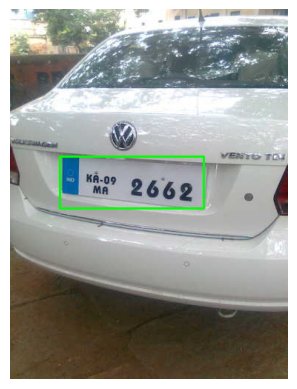


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars78.png: 256x320 1 license_plate, 69.2ms
Speed: 1.3ms preprocess, 69.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Detected text: KL54:A-2670


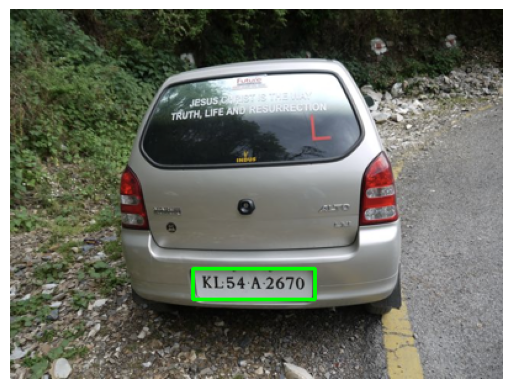


image 1/1 /content/drive/MyDrive/dataset_licenseplate/images/Cars73.png: 192x320 1 license_plate, 48.2ms
Speed: 1.1ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
Detected text: TN SSF 2378


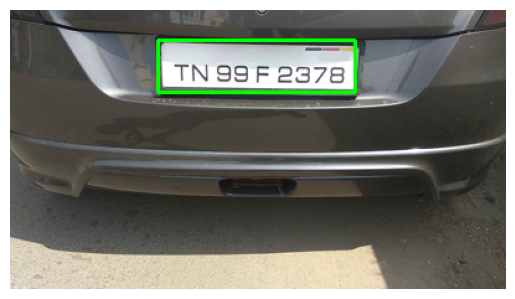

       Filename      Predicted Text
0   Cars425.png            G526 JHD
1   Cars181.png        | JHNTHAD |}
2    Cars30.png           7) res ee
3    Cars30.png           EEIIEXELY
4   Cars364.png            380 5099
5   Cars408.png                    
6   Cars253.png          crnenacne|
7   Cars155.png            'NCB-O25
8   Cars168.png                FA5g
9   Cars415.png                    
10  Cars152.png         © DL49 AK49
11   Cars70.png                 i—J
12  Cars203.png           4CZI7 KOD
13  Cars335.png                 ie]
14  Cars335.png  ICT RANGEDEAVER cc
15   Cars39.png         MH 15BD8677
16  Cars395.png                    
17  Cars274.png             MANISA’
18   Cars72.png        MDL7C N 5617
19    Cars9.png         MHO1AV8866)
20  Cars281.png                 Pa]
21  Cars287.png        MDL7C N 5617
22  Cars353.png                  ry
23   Cars55.png               9214)
24  Cars198.png         MHO1AV8866)
25  Cars148.png                Done
26  Cars392.png             

In [ ]:
import cv2
import pytesseract
import pandas as pd
import matplotlib.pyplot as plt
import os

# Fungsi untuk menyimpan hasil prediksi ke file CSV
def save_predictions_to_csv(predictions, output_file='predictions.csv'):
    df = pd.DataFrame(predictions, columns=['filename', 'predicted_text'])
    df.to_csv(output_file, index=False)

def predict_and_plot(path_test_car):
    results = model.predict(path_test_car, device='cpu')

    image = cv2.imread(path_test_car)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    predictions = []  # Daftar untuk menyimpan hasil prediksi

    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])

            # Gambar kotak di gambar asli
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Crop img
            roi = image[y1:y2, x1:x2]

            # Perform OCR on the cropped image
            text = pytesseract.image_to_string(roi, config='--psm 6')
            print(f"Detected text: {text.strip()}")  # Tampilkan teks yang terdeteksi

            # Simpan nama file dan teks terdeteksi
            predictions.append((os.path.basename(path_test_car), text.strip()))

    # Tampilkan gambar
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    return predictions  # Kembalikan hasil prediksi

# Misalkan test adalah DataFrame yang berisi path gambar
# Contoh: test = pd.DataFrame({'img_path': ['path/to/image1.png', 'path/to/image2.png', ...]})
all_predictions = []  # Daftar untuk menyimpan semua hasil prediksi

# Loop untuk memproses setiap gambar di DataFrame
for i in range(len(test)):
    image_path = test.iloc[i].img_path  # Ambil path gambar dari DataFrame
    predictions = predict_and_plot(image_path)  # Panggil fungsi untuk setiap gambar
    all_predictions.extend(predictions)  # Tambahkan hasil prediksi ke daftar

# Simpan semua prediksi ke dalam file CSV
save_predictions_to_csv(all_predictions)

# Tampilkan tabel hasil prediksi
predictions_df = pd.DataFrame(all_predictions, columns=['Filename', 'Predicted Text'])
print(predictions_df)